In [64]:
import torch
import CARZero
import pandas as pd

from utils import *
import matplotlib.pyplot as plt
import cv2  # or use PIL to load image
import math
import seaborn as sns

device = "cuda" if torch.cuda.is_available() else "cpu"

In [65]:
def get_dqn_similarities(CARZero_model, imgs, txts, similarity_type="both"):
    if similarity_type not in ["global", "local", "both"]:
        raise RuntimeError(f"similarity type should be one of ['global', 'local', 'both']")
    if type(txts) == str or type(txts) == list:
        raise RuntimeError(f"Text input not processed - please use CARZero_model.process_text")
    if type(imgs) == str or type(imgs) == list:
        raise RuntimeError(f"Image input not processed - please use CARZero_model.process_img")

    with torch.no_grad():
        CARZero_model.eval()
        label_img_emb_l, label_img_emb_g = CARZero_model.image_encoder_forward(imgs)
        query_emb_l, query_emb_g, _ = CARZero_model.text_encoder_forward(
            txts["caption_ids"], txts["attention_mask"], txts["token_type_ids"]
        )

        cls_bs = []
        atten_i2t_list = []
        atten_t2i_list = []
        bs = label_img_emb_g.size(0)

        for i in range(bs):
            label_img_emb_l_ = label_img_emb_l[i : i + 1].view(
                label_img_emb_l[i : i + 1].size(0),
                label_img_emb_l[i : i + 1].size(1),
                -1,
            )
            label_img_emb_g_ = label_img_emb_g[i : i + 1]
            label_img_emb_l_ = label_img_emb_l_.permute(0, 2, 1)  # patch_num b dim
            query_emb_l_ = query_emb_l.view(query_emb_l.size(0), query_emb_l.size(1), -1)
            query_emb_l_ = query_emb_l_.permute(0, 2, 1)  # patch_num b dim

            i2t_cls, atten_i2t = CARZero_model.fusion_module(
                torch.cat([label_img_emb_g_.unsqueeze(1), label_img_emb_l_], dim=1),
                query_emb_g,
                return_atten=True,
            )
            i2t_cls = i2t_cls.squeeze(-1)  

            t2i_cls, atten_t2i = CARZero_model.fusion_module(
                torch.cat([query_emb_g.unsqueeze(1), query_emb_l_], dim=1),
                label_img_emb_g_,
                return_atten=True,
            )
            t2i_cls = t2i_cls.squeeze(-1).transpose(1, 0)

            cls = (i2t_cls + t2i_cls) / 2
            cls_bs.append(cls)
            
            # collect attention maps
            atten_i2t_list.append([x.cpu() for x in atten_i2t])
            atten_t2i_list.append([x.cpu() for x in atten_t2i])

        cls = torch.cat(cls_bs, dim=0)
        # Stack attention maps per batch
        atten_i2t_list = [torch.stack(heads) for heads in atten_i2t_list]
        atten_t2i_list = [torch.stack(heads) for heads in atten_t2i_list]
        atten_i2t_all = torch.stack(atten_i2t_list)
        atten_t2i_all = torch.stack(atten_t2i_list)

        return cls.detach().cpu().numpy(), atten_i2t_all, atten_t2i_all

def dqn_shot_classification(CARZero_model, imgs, cls_txt_mapping):
    caption_ids = []
    attention_mask = []
    token_type_ids = []
    for cls_name, txts in cls_txt_mapping.items():
        caption_ids.append(txts["caption_ids"])
        attention_mask.append(txts["attention_mask"])
        token_type_ids.append(txts["token_type_ids"])

    caption_ids = torch.cat(caption_ids, dim=0)
    attention_mask = torch.cat(attention_mask, dim=0)
    token_type_ids = torch.cat(token_type_ids, dim=0)
    text_batch = {
        "caption_ids": caption_ids,
        "attention_mask": attention_mask,
        "token_type_ids": token_type_ids,
    }

    cls_similarity, atten_i2t, atten_t2i = get_dqn_similarities(
        CARZero_model, imgs, text_batch, similarity_type="both"
    )

    class_similarities = pd.DataFrame(cls_similarity, columns=cls_txt_mapping.keys())
    # Return similarity dataframe and attention maps for visualization
    return class_similarities, atten_i2t, atten_t2i

In [66]:
CARZero_model = CARZero.load_CARZero(name="CARZero_vit_b_16", device=device)

/home/lpk/miniconda3/envs/carzero/lib/python3.10/site-packages/huggingface_hub/file_download.py:896: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


matched keys: 150


In [55]:
img_paths = [
    "/home/lpk/CARZero/ChestXray14/images_011/00025922_001.png", # No sickness [0 0 0 0 0 0 0 0 0 0 0 0 0 0]
    "/home/lpk/CARZero/ChestXray14/images_011/00026867_000.png", # Pulmonary Infiltration [0 0 0 1 0 0 0 0 0 0 0 0 0 0]
    "/home/lpk/CARZero/ChestXray14/images_007/00015995_007.png", # Pulmonary Edema [0 0 0 0 0 0 0 0 0 1 0 0 0 0]
]

cls_prompts = {
    "0": ["There is Atelectasis"],
    "1": ["There is Cardiomegaly"],
    "2": ["There is Pleural Effusion"],
    "3": ["There is Pulmonary Infiltration"],
    "4": ["There is Pulmonary Mass"],
    "5": ["There is Lung Nodule"],
    "6": ["There is Pneumonia"],
    "7": ["There is Pneumothorax"],
    "8": ["There is Pulmonary Consolidation"],
    "9": ["There is Pulmonary Edema"],
    "10": ["There is Pulmonary Emphysema"],
    "11": ["There is Fibrosis"],
    "12": ["There is Pleural Thickening"],
    "13": ["There is Hernia"],
    "14": ["There is no sickness"], # NEW -> for demoing purpose
}

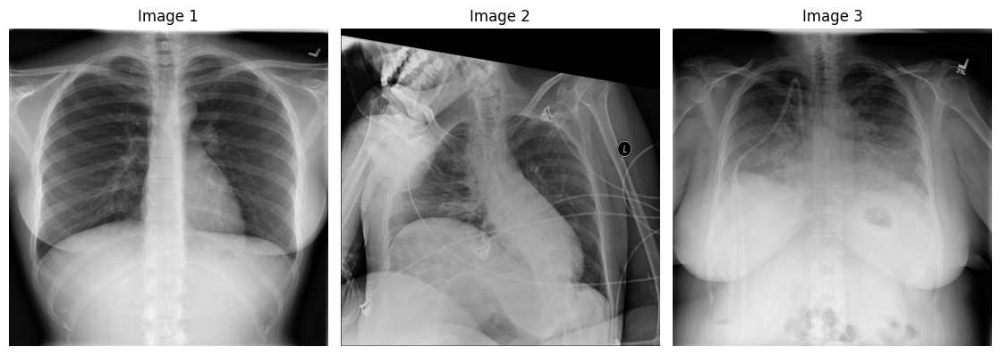

In [67]:
def show_all_images(img_paths, cols=4, figsize=(15, 10)):
    rows = math.ceil(len(img_paths) / cols)
    plt.figure(figsize=figsize)

    for i, path in enumerate(img_paths):
        img = cv2.imread(path)
        if img is None:
            print(f"Failed to load {path}")
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title(f"Image {i+1}")

    plt.tight_layout()
    plt.show()

# Example call:
show_all_images(img_paths)


In [68]:
processed_txt = CARZero_model.process_class_prompts(cls_prompts, device)
processed_imgs = CARZero_model.process_img(img_paths, device)

similarities, atten_i2t, atten_t2i = dqn_shot_classification(
    CARZero_model, processed_imgs, processed_txt
)

/home/lpk/CARZero/CARZero/models/CARZero_model_dqn_wo_self_atten_gl_mlp.py:333: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  all_imgs.append(torch.tensor(img))


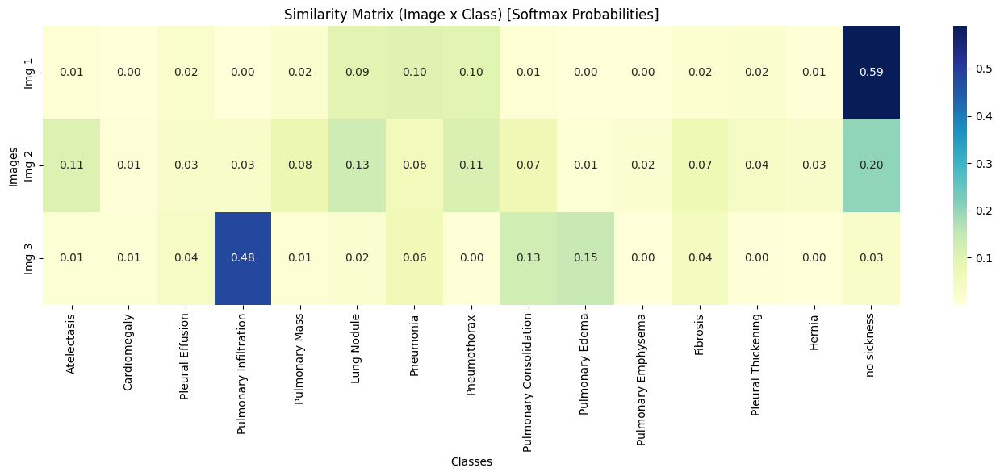

In [69]:
# similarities

sim_matrix_logits = torch.tensor(similarities.values)
sim_matrix_probs = torch.nn.functional.softmax(sim_matrix_logits, dim=1).numpy()

xtick_labels = [v[0].replace("There is ", "") for k, v in cls_prompts.items()]
sim_matrix = similarities.values

plt.figure(figsize=(14, 6))
sns.heatmap(
    sim_matrix_probs,
    annot=True,
    fmt=".2f",
    xticklabels=xtick_labels,
    yticklabels=[f"Img {i+1}" for i in range(len(img_paths))],
    cmap="YlGnBu"
)
plt.title("Similarity Matrix (Image x Class) [Softmax Probabilities]")
plt.xlabel("Classes")
plt.ylabel("Images")
plt.tight_layout()
plt.show()

In [70]:
# print(atten_i2t.shape)
# print(atten_t2i.shape)

atten_i2t = atten_i2t.squeeze(2)

atten_i2t.shape

torch.Size([3, 4, 15, 197])

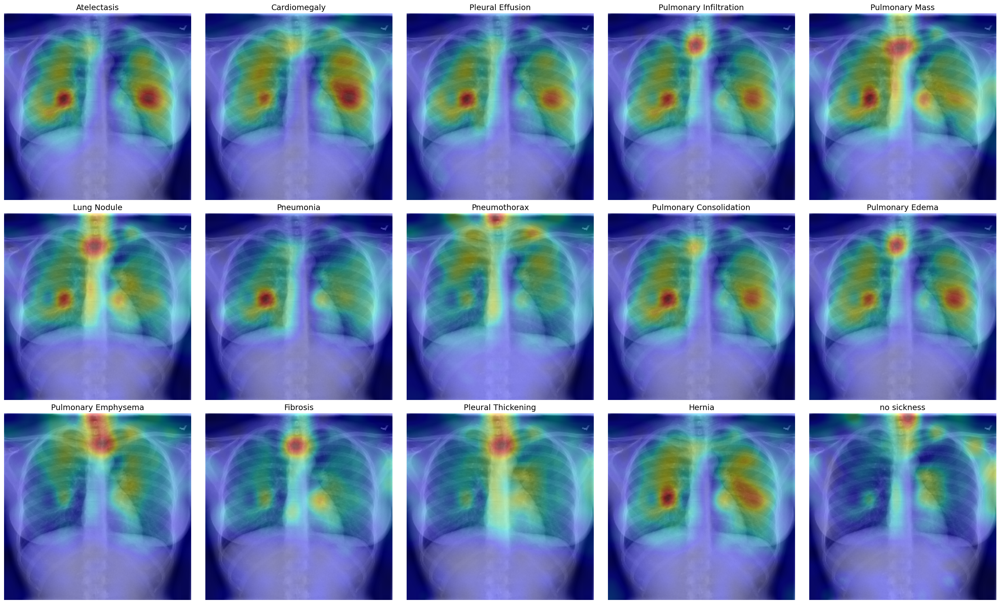

In [71]:
def get_attention_overlay(img_idx, head_idx, class_idx):
    # Load and preprocess image
    img = cv2.imread(img_paths[img_idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))

    patch_attn_vec = atten_i2t[img_idx, head_idx, class_idx, 1:]
    patch_attn = (
        patch_attn_vec.reshape(14, 14).cpu().numpy()
    )  # convert to numpy, make sure tensor on CPU

    # Resize attention to match image size
    attn_resized = cv2.resize(patch_attn, (224, 224), interpolation=cv2.INTER_CUBIC)

    # Normalize for visualization
    norm_attn = (attn_resized - attn_resized.min()) / (
        attn_resized.max() - attn_resized.min()
    )

    # Create heatmap
    heatmap = (plt.cm.jet(norm_attn)[:, :, :3] * 255).astype(np.uint8)

    # Overlay heatmap on image
    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    return overlay


def show_all_classes_grid(img_idx, head_idx, classes_per_row=3):
    num_classes = atten_i2t.shape[2]
    num_rows = math.ceil(num_classes / classes_per_row)

    fig, axs = plt.subplots(
        num_rows, classes_per_row, figsize=(5 * classes_per_row, 5 * num_rows)
    )

    for class_idx in range(num_classes):
        row = class_idx // classes_per_row
        col = class_idx % classes_per_row

        overlay = get_attention_overlay(img_idx, head_idx, class_idx)

        # If axs is 2D, index by [row, col], else if 1D or single subplot, handle accordingly
        if num_rows > 1:
            ax = axs[row, col]
        else:
            ax = axs[col] if classes_per_row > 1 else axs

        ax.imshow(overlay)
        ax.set_title(f"{xtick_labels[class_idx]}", fontsize=14)
        ax.axis("off")

    # Hide any unused subplots (in last row if classes don't fill all columns)
    total_plots = num_rows * classes_per_row
    for idx in range(num_classes, total_plots):
        row = idx // classes_per_row
        col = idx % classes_per_row
        if num_rows > 1:
            axs[row, col].axis("off")
        else:
            axs[col].axis("off")

    plt.tight_layout()
    plt.show()


# Run to display
show_all_classes_grid(img_idx=0, head_idx=3, classes_per_row=5)

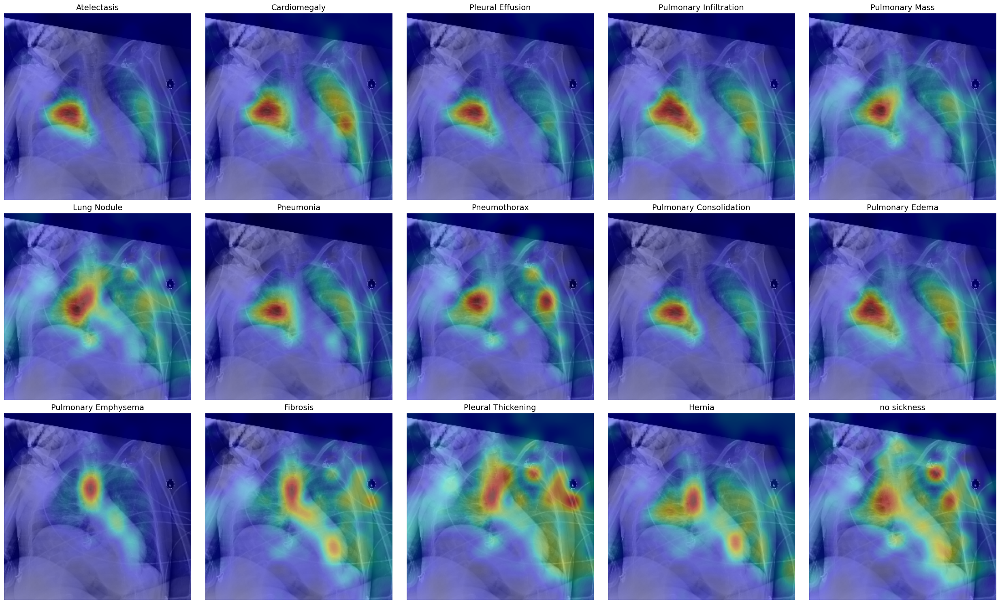

In [72]:
show_all_classes_grid(img_idx=1, head_idx=3, classes_per_row=5)

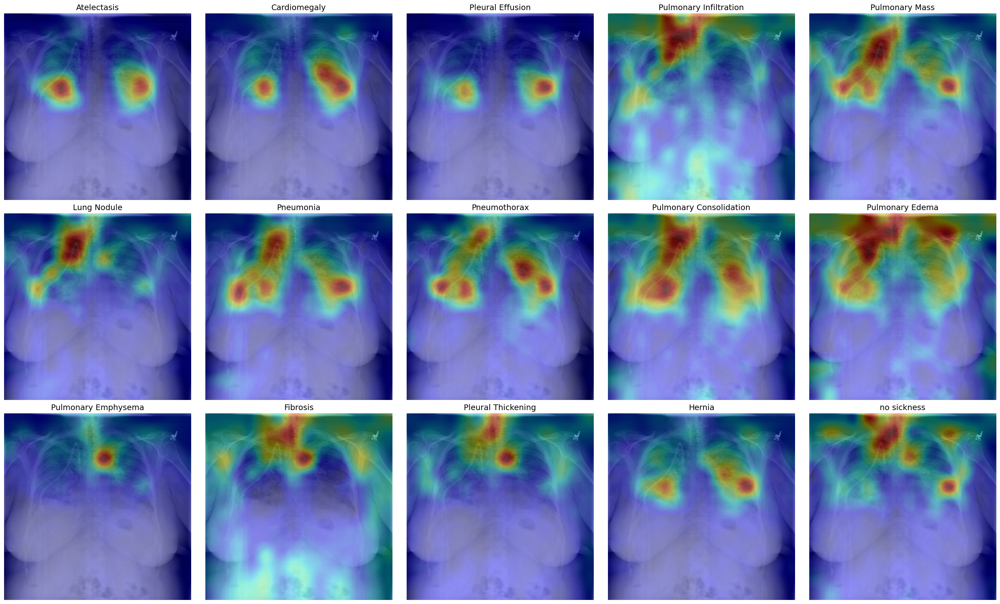

In [73]:
show_all_classes_grid(img_idx=2, head_idx=3, classes_per_row=5)